In [1]:
import os

path = '/Users/kamakshiojha/Documents/Machine_Learning_projects/Day_Night_conversion'

if os.path.exists(path):
    contents = os.listdir(path)

In [2]:
for item in contents:
        print(item)

image_conversion.ipynb
.ipynb_checkpoints
Daynight_datset


In [3]:
Day_dir = os.path.join('/Users/kamakshiojha/Documents/Machine_Learning_projects/Day_Night_conversion/Daynight_datset/day')
Night_dir = os.path.join('/Users/kamakshiojha/Documents/Machine_Learning_projects/Day_Night_conversion/Daynight_datset/night')


In [4]:
Day_names = os.listdir(Day_dir)
print(Day_names[:10])

Night_names = os.listdir(Night_dir)
print(Night_names[:10])

['63.jpg', '189.jpg', '77.jpg', '162.jpg', '176.jpg', '88.jpg', '348.jpg', '360.jpg', '406.jpg', '412.jpg']
['63.jpg', '189.jpg', '77.jpg', '162.jpg', '176.jpg', '88.jpg', '214.jpg', '200.jpg', '201.jpg', '215.jpg']


In [5]:
print('total train Day images:' , len(os.listdir(Day_dir)))
print('total train Night images:' , len(os.listdir(Night_dir)))

total train Day images: 522
total train Night images: 227


In [6]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

nrows = 4
ncols = 4

pic_index = 0

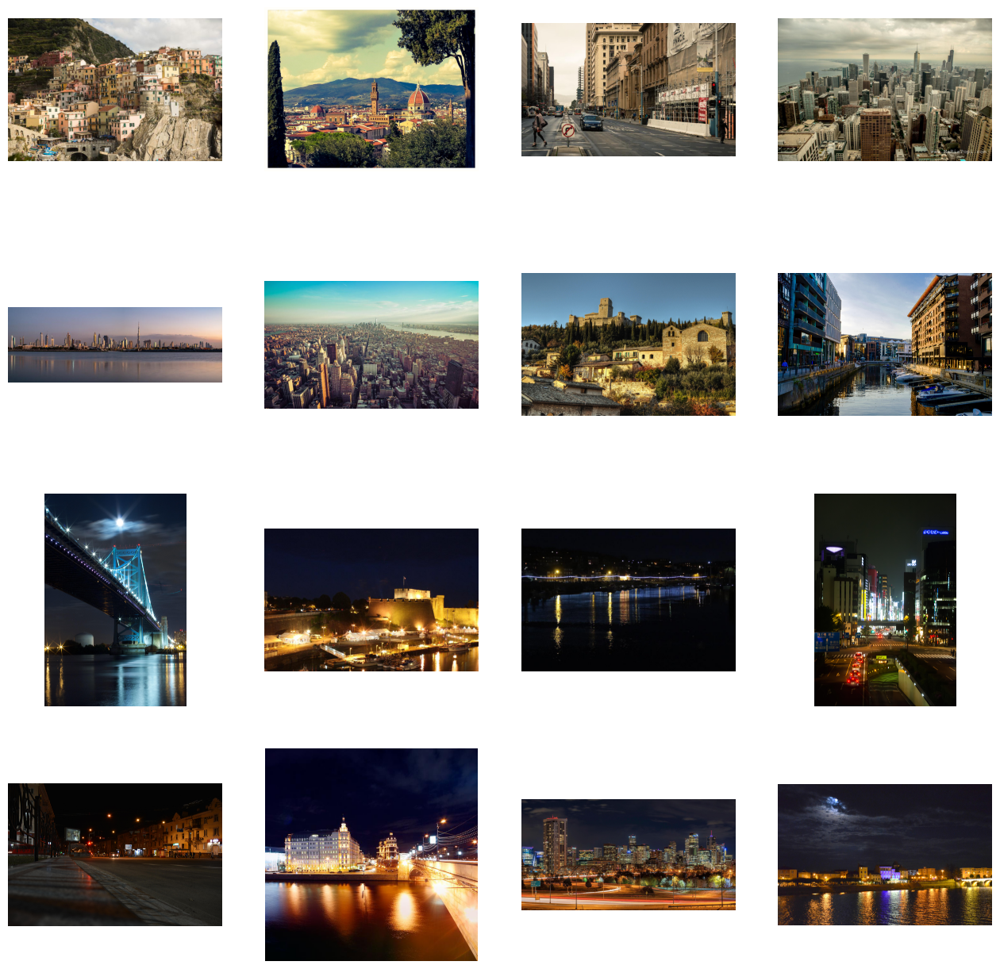

In [7]:
fig= plt.gcf()
fig.set_size_inches(ncols*4,nrows*4)

pic_index += 8
next_day_pix = [os.path.join(Day_dir, fname)
                  for fname in Day_names[pic_index-8:pic_index]]

next_night_pix = [os.path.join(Night_dir, fname)
                  for fname in Night_names[pic_index-8:pic_index]]

for i, img_path in enumerate(next_day_pix + next_night_pix):
    sp = plt.subplot(nrows,ncols,i+1)
    sp.axis('off')
    img = mpimg.imread(img_path)
    plt.imshow(img)

plt.show()

In [8]:
%matplotlib inline

import os
import numpy as np
import pandas as pd
from imageio import imread

import keras
from keras.models import Sequential
from keras.layers import Dense, Flatten, Reshape, InputLayer
from keras.regularizers import L1L2

In [9]:
import tensorflow as tf

In [27]:
import tensorflow_datasets as tfds
from tensorflow_examples.models.pix2pix import pix2pix

import os
import time
import matplotlib.pyplot as plt
from IPython.display import clear_output

AUTOTUNE = tf.data.experimental.AUTOTUNE

In [28]:
BUFFER_SIZE = 1000
BATCH_SIZE = 1
IMG_WIDTH = 256
IMG_HEIGHT = 256

In [29]:
def random_crop(image):
    cropped_image = tf.image.random_crop(
    image, size=[IMG_HEIGHT, IMG_WIDTH, 3])
    return cropped_image

In [30]:
def load_image(image_file):
    image = tf.io.read_file(image_file)
    image = tf.image.decode_jpeg(image)
    return image

In [31]:

def normalize(image):
  image = tf.cast(image, tf.float32)
  image = (image / 127.5) - 1
  return image

In [32]:
def random_jitter(image):
  # resizing to 286 x 286 x 3
  image = tf.image.resize(image, [286, 286],
                          method=tf.image.ResizeMethod.NEAREST_NEIGHBOR)

  image = random_crop(image)

  image = tf.image.random_flip_left_right(image)

  return image

In [37]:
def preprocess_image_train(image):
    # Example preprocessing for training
    image = tf.image.resize(image, [256, 256])
    image = (image / 127.5) - 1  # normalize to [-1, 1]
    return image

def preprocess_image_test(image):
    # Example preprocessing for testing
    image = tf.image.resize(image, [256, 256])
    image = (image / 127.5) - 1  # normalize to [-1, 1]
    return image

In [38]:
train_day_files = tf.data.Dataset.list_files(os.path.join(Day_dir, '*.jpg'))
train_night_files = tf.data.Dataset.list_files(os.path.join(Night_dir, '*.jpg'))


In [39]:
train_day = train_day_files.cache().map(
    load_image, num_parallel_calls=AUTOTUNE).map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

train_night = train_night_files.cache().map(
    load_image, num_parallel_calls=AUTOTUNE).map(
    preprocess_image_train, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_day = train_day_files.cache().map(
    load_image, num_parallel_calls=AUTOTUNE).map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)

test_night = train_night_files.cache().map(
    load_image, num_parallel_calls=AUTOTUNE).map(
    preprocess_image_test, num_parallel_calls=AUTOTUNE).shuffle(
    BUFFER_SIZE).batch(BATCH_SIZE)


In [42]:
sample_day = next(iter(train_day))
sample_night = next(iter(train_night))

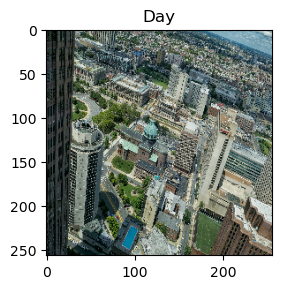

In [43]:
plt.subplot(121)
plt.title('Day')
plt.imshow(sample_day[0] * 0.5 + 0.5)

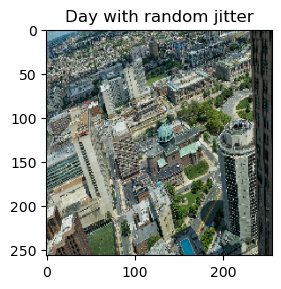

In [44]:
plt.subplot(122)
plt.title('Day with random jitter')
plt.imshow(random_jitter(sample_day[0]) * 0.5 + 0.5)

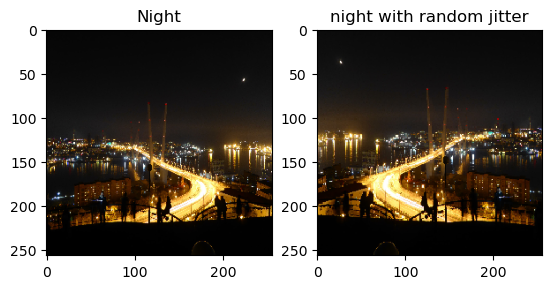

In [45]:
plt.subplot(121)
plt.title('Night')
plt.imshow(sample_night[0] * 0.5 + 0.5)

plt.subplot(122)
plt.title('night with random jitter')
plt.imshow(random_jitter(sample_night[0]) * 0.5 + 0.5)

In [46]:
OUTPUT_CHANNELS = 3

generator_g = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')
generator_f = pix2pix.unet_generator(OUTPUT_CHANNELS, norm_type='instancenorm')

discriminator_x = pix2pix.discriminator(norm_type='instancenorm', target=False)
discriminator_y = pix2pix.discriminator(norm_type='instancenorm', target=False)

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


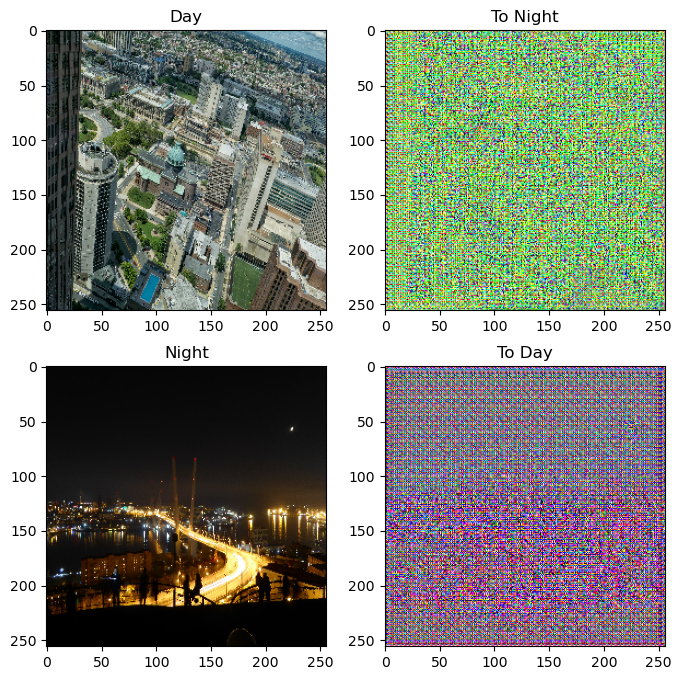

In [47]:
to_night = generator_g(sample_day)
to_day = generator_f(sample_night)
plt.figure(figsize=(8, 8))
contrast = 8

imgs = [sample_day, to_night, sample_night, to_day]
title = ['Day', 'To Night', 'Night', 'To Day']

for i in range(len(imgs)):
  plt.subplot(2, 2, i+1)
  plt.title(title[i])
  if i % 2 == 0:
    plt.imshow(imgs[i][0] * 0.5 + 0.5)
  else:
    plt.imshow(imgs[i][0] * 0.5 * contrast + 0.5)
plt.show()

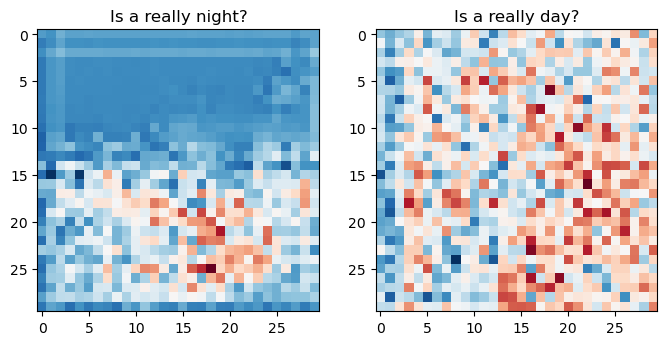

In [48]:
plt.figure(figsize=(8, 8))

plt.subplot(121)
plt.title('Is a really night?')
plt.imshow(discriminator_y(sample_night)[0, ..., -1], cmap='RdBu_r')

plt.subplot(122)
plt.title('Is a really day?')
plt.imshow(discriminator_x(sample_day)[0, ..., -1], cmap='RdBu_r')

plt.show()

In [49]:
LAMBDA = 10

In [50]:
loss_obj = tf.keras.losses.BinaryCrossentropy(from_logits=True)

In [51]:
def discriminator_loss(real, generated):
  real_loss = loss_obj(tf.ones_like(real), real)

  generated_loss = loss_obj(tf.zeros_like(generated), generated)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss * 0.5

In [52]:
def generator_loss(generated):
  return loss_obj(tf.ones_like(generated), generated)

In [53]:
def calc_cycle_loss(real_image, cycled_image):
  loss1 = tf.reduce_mean(tf.abs(real_image - cycled_image))

  return LAMBDA * loss1

In [54]:
def identity_loss(real_image, same_image):
  loss = tf.reduce_mean(tf.abs(real_image - same_image))
  return LAMBDA * 0.5 * loss

In [55]:
generator_g_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
generator_f_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

discriminator_x_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)
discriminator_y_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5)

In [56]:
checkpoint_path = "./checkpoints/train"

ckpt = tf.train.Checkpoint(generator_g=generator_g,
                           generator_f=generator_f,
                           discriminator_x=discriminator_x,
                           discriminator_y=discriminator_y,
                           generator_g_optimizer=generator_g_optimizer,
                           generator_f_optimizer=generator_f_optimizer,
                           discriminator_x_optimizer=discriminator_x_optimizer,
                           discriminator_y_optimizer=discriminator_y_optimizer)

ckpt_manager = tf.train.CheckpointManager(ckpt, checkpoint_path, max_to_keep=5)

# if a checkpoint exists, restore the latest checkpoint.
if ckpt_manager.latest_checkpoint:
  ckpt.restore(ckpt_manager.latest_checkpoint)
  print ('Latest checkpoint restored!!')

In [57]:
EPOCHS = 10

In [58]:
def generate_images(model, test_input):
  prediction = model(test_input)

  plt.figure(figsize=(12, 12))

  display_list = [test_input[0], prediction[0]]
  title = ['Input Image', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    # getting the pixel values between [0, 1] to plot it.
    plt.imshow(display_list[i] * 0.5 + 0.5)
    plt.axis('off')
  plt.show()

In [59]:
@tf.function
def train_step(real_x, real_y):
  # persistent is set to True because the tape is used more than
  # once to calculate the gradients.
  with tf.GradientTape(persistent=True) as tape:
    # Generator G translates X -> Y
    # Generator F translates Y -> X.

    fake_y = generator_g(real_x, training=True)
    cycled_x = generator_f(fake_y, training=True)

    fake_x = generator_f(real_y, training=True)
    cycled_y = generator_g(fake_x, training=True)

    # same_x and same_y are used for identity loss.
    same_x = generator_f(real_x, training=True)
    same_y = generator_g(real_y, training=True)

    disc_real_x = discriminator_x(real_x, training=True)
    disc_real_y = discriminator_y(real_y, training=True)

    disc_fake_x = discriminator_x(fake_x, training=True)
    disc_fake_y = discriminator_y(fake_y, training=True)

    # calculate the loss
    gen_g_loss = generator_loss(disc_fake_y)
    gen_f_loss = generator_loss(disc_fake_x)

    total_cycle_loss = calc_cycle_loss(real_x, cycled_x) + calc_cycle_loss(real_y, cycled_y)

    # Total generator loss = adversarial loss + cycle loss
    total_gen_g_loss = gen_g_loss + total_cycle_loss + identity_loss(real_y, same_y)
    total_gen_f_loss = gen_f_loss + total_cycle_loss + identity_loss(real_x, same_x)

    disc_x_loss = discriminator_loss(disc_real_x, disc_fake_x)
    disc_y_loss = discriminator_loss(disc_real_y, disc_fake_y)

  # Calculate the gradients for generator and discriminator
  generator_g_gradients = tape.gradient(total_gen_g_loss, 
                                        generator_g.trainable_variables)
  generator_f_gradients = tape.gradient(total_gen_f_loss, 
                                        generator_f.trainable_variables)

  discriminator_x_gradients = tape.gradient(disc_x_loss, 
                                            discriminator_x.trainable_variables)
  discriminator_y_gradients = tape.gradient(disc_y_loss, 
                                            discriminator_y.trainable_variables)

  # Apply the gradients to the optimizer
  generator_g_optimizer.apply_gradients(zip(generator_g_gradients, 
                                            generator_g.trainable_variables))

  generator_f_optimizer.apply_gradients(zip(generator_f_gradients, 
                                            generator_f.trainable_variables))

  discriminator_x_optimizer.apply_gradients(zip(discriminator_x_gradients,
                                                discriminator_x.trainable_variables))

  discriminator_y_optimizer.apply_gradients(zip(discriminator_y_gradients,
                                                discriminator_y.trainable_variables))

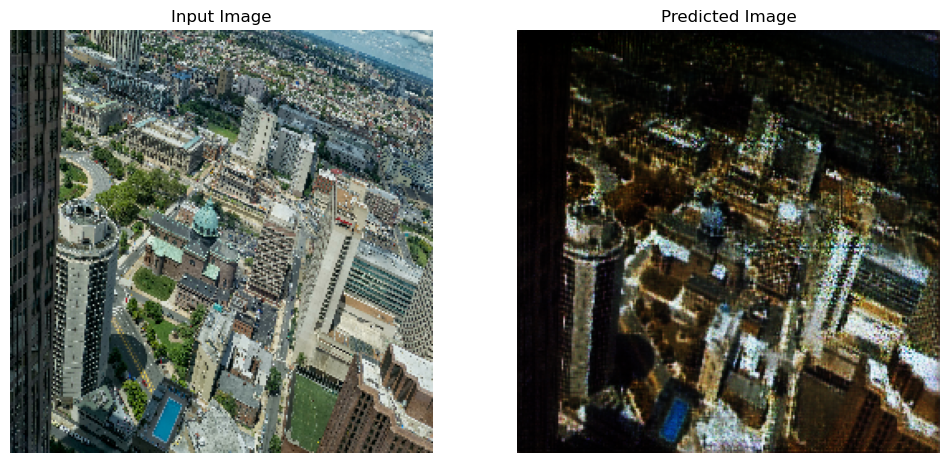

Saving checkpoint for epoch 10 at ./checkpoints/train/ckpt-2
Time taken for epoch 10 is 586.4781596660614 sec



In [62]:
for epoch in range(EPOCHS):
  start = time.time()

  n = 0
  for image_x, image_y in tf.data.Dataset.zip((train_day, train_night)):
    train_step(image_x, image_y)
    if n % 10 == 0:
      print ('=', end='')
    n += 1

  clear_output(wait=True)
  # Using a consistent image (sample_horse) so that the progress of the model
  # is clearly visible.
  generate_images(generator_g, sample_day)

  if (epoch + 1) % 5 == 0:
    ckpt_save_path = ckpt_manager.save()
    print ('Saving checkpoint for epoch {} at {}'.format(epoch+1,
                                                         ckpt_save_path))

  print ('Time taken for epoch {} is {} sec\n'.format(epoch + 1,
                                                      time.time()-start))

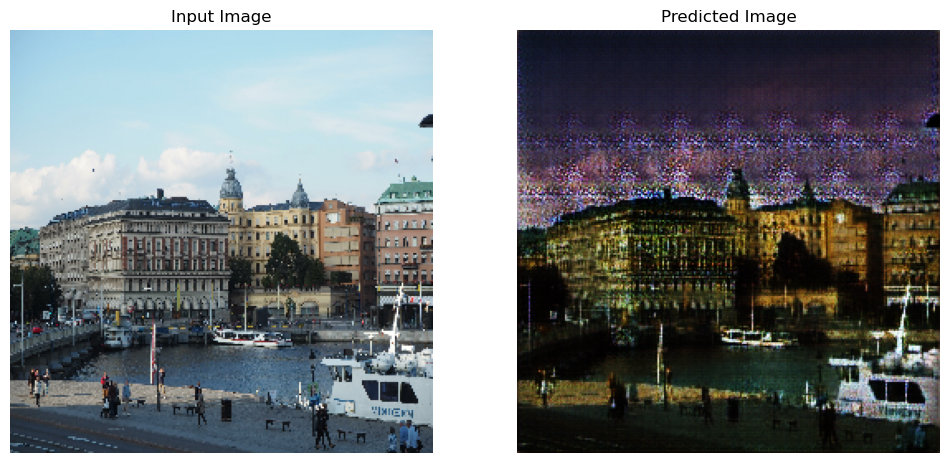

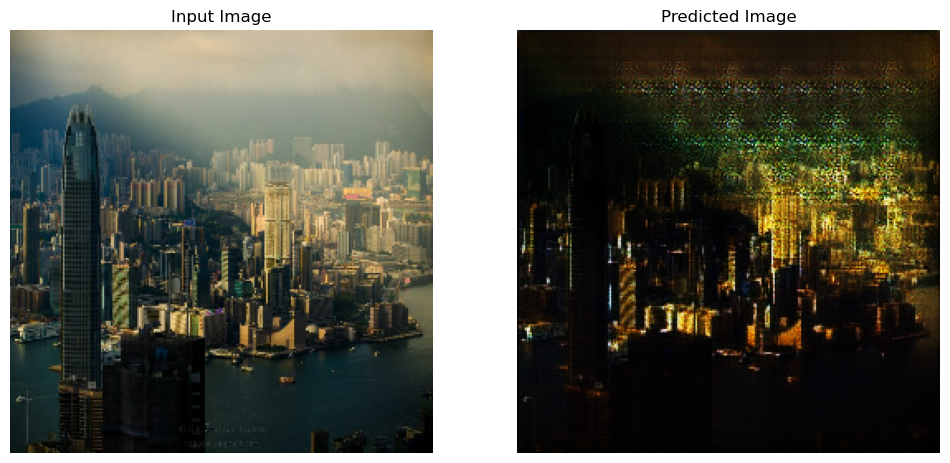

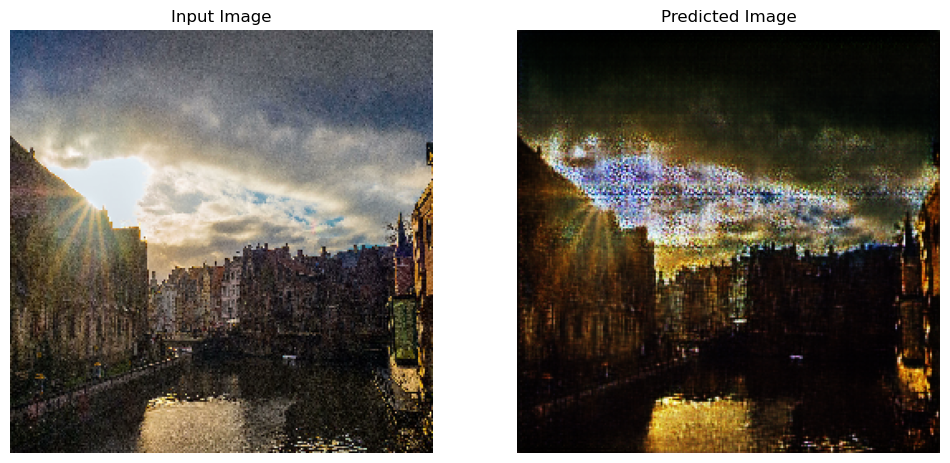

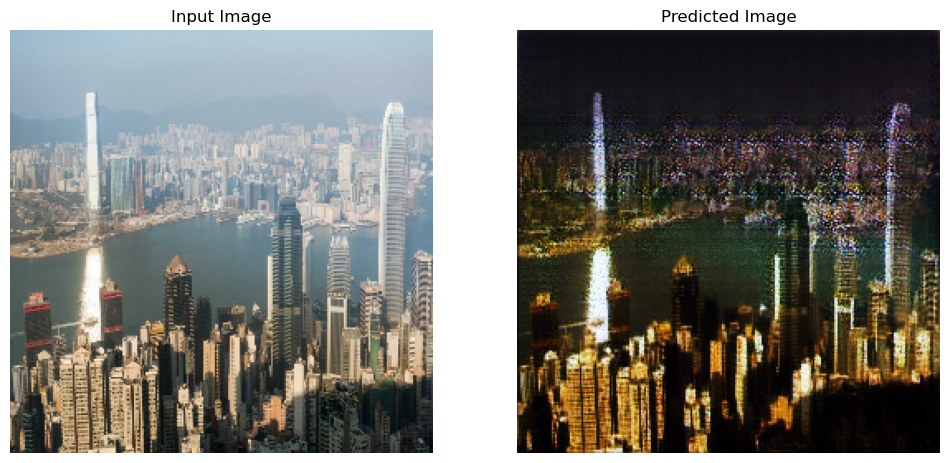

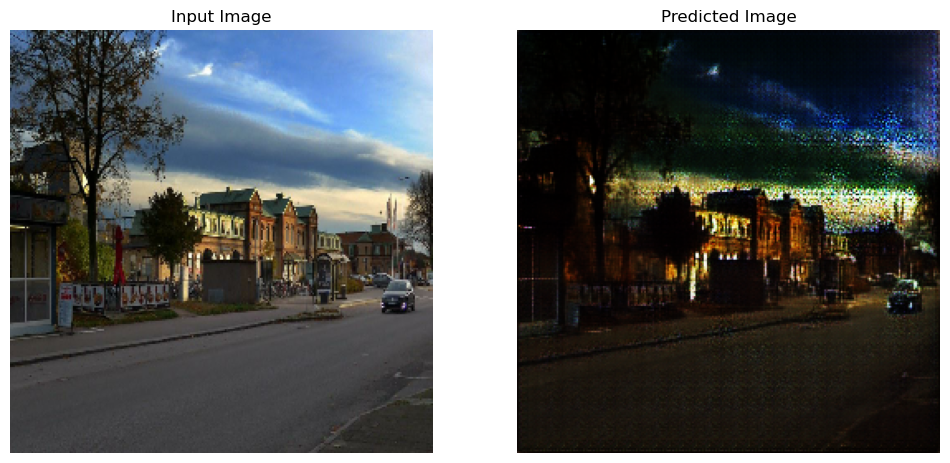

2024-05-26 18:55:50.294711: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [63]:
# Run the trained model on the test dataset
for inp in test_day.take(5):
  generate_images(generator_g, inp)

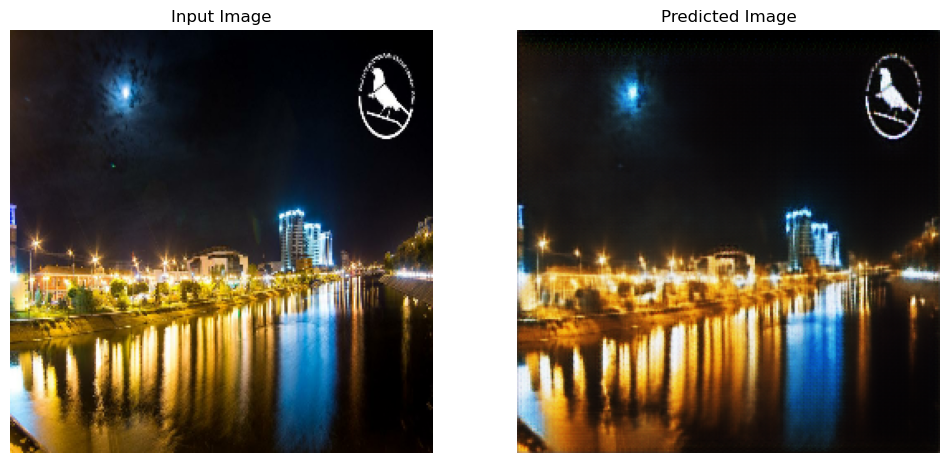

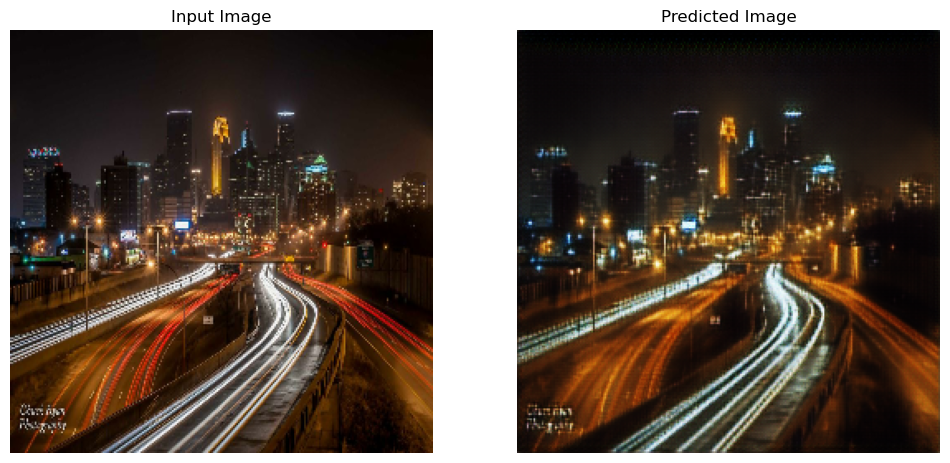

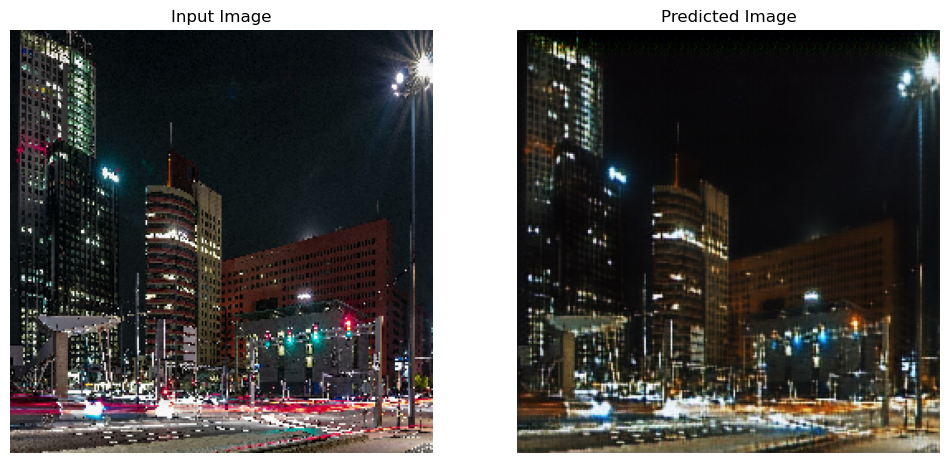

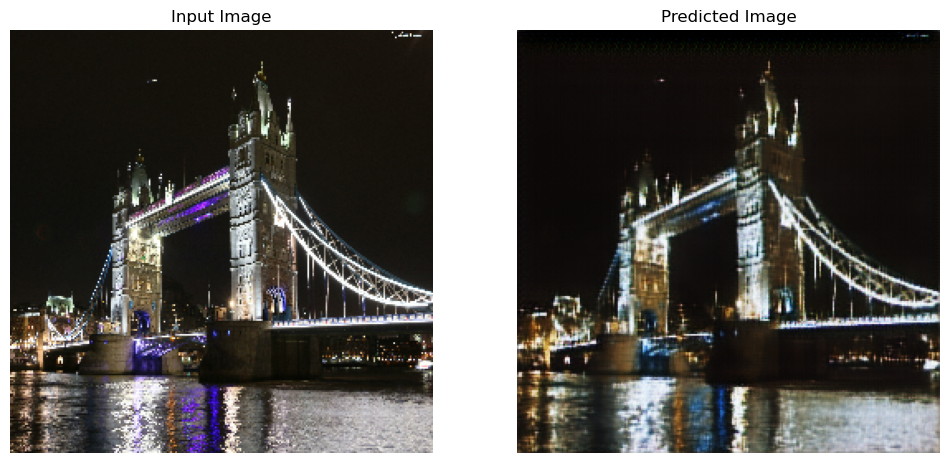

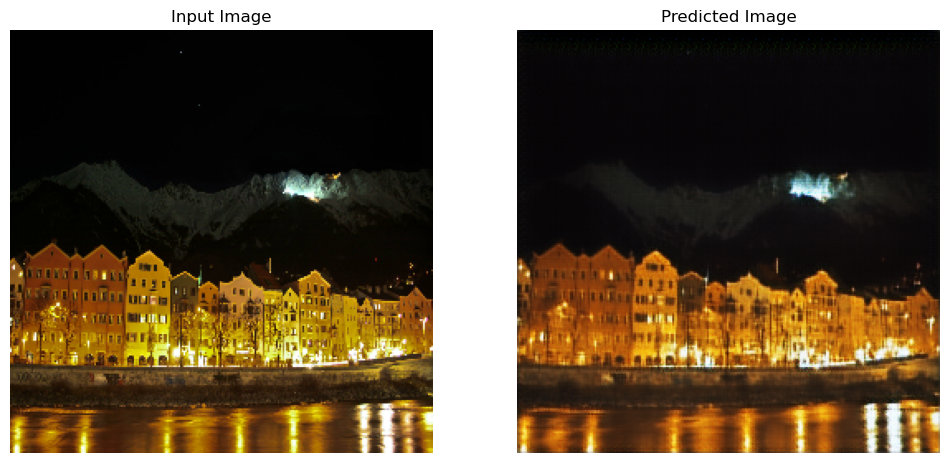

2024-05-26 18:57:37.628983: W tensorflow/core/framework/local_rendezvous.cc:404] Local rendezvous is aborting with status: OUT_OF_RANGE: End of sequence


In [64]:
# Run the trained model on the test dataset
for inp in test_night.take(5):
  generate_images(generator_g, inp)